# Multi-Object Tracking-Detection Tutorial



*   Tutorial Author [Esteve Valls Mascaro](https://github.com/Evm7/Tutorials-Computer-Vision)

We will make use of the tracking-detection approach, where an object detector model (Yolov5 or FasterRCNN in our case) is used to detect several objects (pre-trained weights) and then the tracker (DeepSort for us) basically associates the detections between frames to give some temporal continuity to each object.


This tutorial has been explained and developed step-by-step.

For quick processing of videos, please turn on the GPU execution

## Object Detection

Several models are currently used for Object Detection. In this tutorial we will make use of two of the state-of-the-art, based on:

*   Single-Stage Method: [Yolov5](https://github.com/ultralytics/yolov5/tree/master)
*   Two-Stage Approach: [Faster-RCN with FPN](https://openaccess.thecvf.com/content_cvpr_2017/papers/Lin_Feature_Pyramid_Networks_CVPR_2017_paper.pdf)



###  Preparation

#### Dataset downloading and visualization
First of all we will download some Videos to ensure the reproducibility of the code

In [1]:
!  pip install --ignore-installed PyYAML

     |████████████████████████████████| 596 kB 5.4 MB/s 


In [2]:
!pip install -q gdown

In [ ]:
! mkdir /content/inputs
! wget https://j.gifs.com/325l3R@facebook.gif -O /content/inputs/cooking_gif.mp4
! gdown https://drive.google.com/u/1/uc?id=19hgw-kp2qM0rs4-KoaR8Ou8xrjgiQOoD
! unzip ETRI-Activity3D_Sample_en.zip
! rm /content/ETRI-Activity3D.xlsx
! rm /content/ETRI-Activity3D_Sample_en.zip
! wget 'https://hispanosemprendedores.com/wp-content/uploads/2020/12/woman-preparing-healthy-food-in-the-home-kitchen-P5QED9A.jpg'  -O /content/inputs/cooking_img.jpg
! mv /content/SampleVideos/10_RGB.mp4  /content/inputs/10_RGB.mp4
! mv /content/SampleVideos/24_RGB.mp4  /content/inputs/24_RGB.mp4
! mv /content/SampleVideos/29_RGB.mp4  /content/inputs/29_RGB.mp4
! mv /content/SampleVideos/1_RGB.mp4  /content/inputs/1_RGB.mp4
! rm -r /content/SampleVideos

In [4]:
!mkdir /content/outputs
from IPython.display import HTML
from base64 import b64encode
import os
def showVideo(path):
  compressed_path = "/content/outputs/"+os.path.basename(path)+"compressed.mp4"

  os.system(f"ffmpeg -i {path} -vcodec libx264 {compressed_path}")

  # Show video
  mp4 = open(compressed_path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width=400 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url)

In [5]:
# Visualization of a video
showVideo("/content/inputs/10_RGB.mp4")

#### Function Definition

In [7]:
import numpy as np
import torchvision.transforms as transforms

names= ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
        'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
        'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
        'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
        'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
        'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
        'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
        'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
        'hair drier', 'toothbrush']  # class names

names_faster = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
COLORS = np.random.uniform(0, 255, size=(len(names), 3))

transform = transforms.Compose([
    transforms.ToTensor(),
])

In [8]:
import time, torch, cv2

def prepare_video(input_path, output_path, scale=1):
    cap = cv2.VideoCapture(input_path)
    if not cap.isOpened():
        print('Could not open {} video'.format(input_path), flush=True)
        sys.exit()

    fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v')
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    size = (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) / scale), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) / scale))
    out = cv2.VideoWriter(str(output_path), fourcc, int(fps), size)
    frame_length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    return cap, out, device, (fps, size, frame_length)

def rotate_image(frame, size, angle=270):
    image = cv2.resize(frame, size, interpolation=cv2.INTER_AREA)
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 0.5)
    result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    return result

def reformat_frame(frame, size, rotate=False):
    # Re-scale the frame to the desired resolution
    resized_frame = cv2.resize(frame, size, interpolation=cv2.INTER_AREA)
    if rotate:
        image = rotate_image(resized_frame, size)
        return image
    return resized_frame

In [9]:
import numpy as np
def getResults(output, network= "yolov5"):
    if network == "yolov5":
      detection_results = output.pred[0].cpu()
      detection_threshold = 0.2    
      pred_classes = np.array(detection_results[:, -1])
      # get score for all the predicted objects
      pred_scores = np.array(detection_results[:, -2])
      # get all the predicted bounding boxes
      pred_bboxes = np.array(detection_results[:, :4])
      # get boxes above the threshold score
      boxes = pred_bboxes[pred_scores >= detection_threshold].astype(np.int32)
      classes_ids = detection_results[:, -1][pred_scores >= detection_threshold]
      classes  = [names[int(id)] for id in classes_ids]
      scores = pred_scores[pred_scores >= detection_threshold]
      return boxes, classes, scores

    elif network == 'fasterrcnn':
      detecting_results =  output[0]
      detection_threshold=0.7
      pred_classes = np.array([names_faster[i] for i in detecting_results['labels'].cpu().numpy()])
      pred_scores = detecting_results['scores'].detach().cpu().numpy()
      pred_bboxes = detecting_results['boxes'].detach().cpu().numpy()
      boxes = pred_bboxes[pred_scores >= detection_threshold].astype(np.int32)
      classes = pred_classes[pred_scores >= detection_threshold]
      scores =  pred_scores[pred_scores >= detection_threshold]
      return boxes, classes, scores


In [10]:
def draw_boxes(image, boxes, classes):
    # read the image with OpenCV
    #image = cv2.cvtColor(np.asarray(image), cv2.COLOR_BGR2RGB)
    for i, box in enumerate(boxes):
        color = COLORS[names.index(classes[i])]
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color, 2
        )
        cv2.putText(image, classes[i], (int(box[0]), int(box[1]-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2,
                    lineType=cv2.LINE_AA)
    return image

In [11]:
def processImage(model, image, network, device):
  if network == "yolov5":
    output  = model(image)
  elif network == 'fasterrcnn':
    frame = transform(image).to(device)
    frame = frame.unsqueeze(0) # add a batch dimension
    output = model(frame)
  boxes, classes, scores = getResults(output, network)
  image = draw_boxes(image, boxes, classes)
  return image

In [12]:
from google.colab.patches import cv2_imshow
def read_draw_img(model, input_path, output_path, type_network, visualize=True):
  image = cv2.imread(input_path)
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  image_out = processImage(model, image, type_network, device)
  cv2.imwrite(output_path, image_out)
  if visualize:
    cv2_imshow(image_out)

In [13]:
@torch.no_grad()
def processVideo(model, input_video_path, output_video_path, type_network, scale=1):

    cap, out, device, (fps, size, frame_length) = prepare_video(input_video_path, output_video_path,  scale=scale)
    frame_count = 0  # to count total frames
    total_fps = 0  # to get the final frames per second
    start_time_tot = time.time()
    model = model.to(device)
    # read until end of video
    print("[INFO] Video is being processed...")
    while (cap.isOpened()):
        # capture each frame of the video
        ret, frame = cap.read()
        if ret:
            frame = reformat_frame(frame, size)
            frame = processImage(model, frame, type_network, device)
            out.write(frame)

            frame_count += 1
            percentage = float(frame_count / frame_length) * 100
            if (percentage == 100):
                break
        else:
            break

    print("[INFO] Video already processed", flush=True)
    end_time = time.time()
    avg_fps = frame_length/(time.time()- start_time_tot)
    # release VideoCapture()
    cap.release()
    out.release()
    print(f"Average FPS: {avg_fps:.3f}", flush=True)

### Yolo v5

In [14]:
# Model Yolov5 s
yolov5_model = torch.hub.load('ultralytics/yolov5', 'yolov5s', verbose=False)  # or yolov5m, yolov5l, yolov5x, custom

Downloading: "https://github.com/ultralytics/yolov5/archive/master.zip" to /root/.cache/torch/hub/master.zip


requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


YOLOv5 🚀 2021-10-14 torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)




requirements: 1 package updated per /root/.cache/torch/hub/ultralytics_yolov5_master/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



  0%|          | 0.00/14.0M [00:00<?, ?B/s]

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


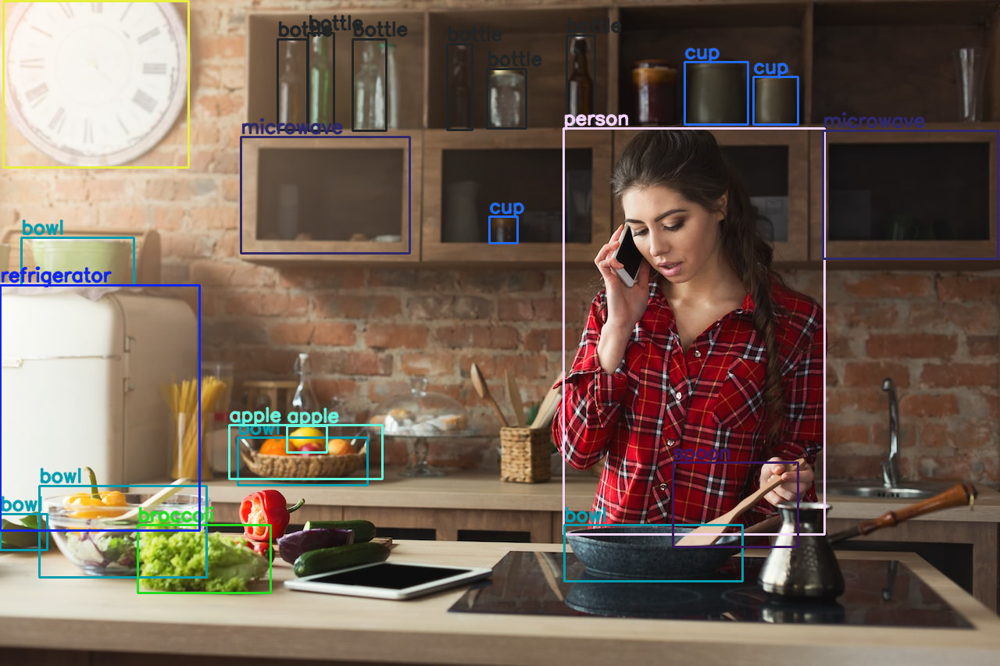

In [15]:
read_draw_img(yolov5_model, "/content/inputs/cooking_img.jpg", "/content/outputs/cooking_img_det_yolo.jpg", "yolov5", visualize=True)

In [16]:
processVideo(yolov5_model, "/content/inputs/cooking_gif.mp4", "/content/outputs/cooking_gif_det_yolo.mp4", "yolov5")

[INFO] Video is being processed...
[INFO] Video already processed
Average FPS: 32.068


In [17]:
# Visualization of a video
showVideo("/content/outputs/cooking_gif_det_yolo.mp4")

### Faster-RCNN

In [18]:
from torchvision import models as models_torch
import torchvision.transforms as transforms

In [21]:
model_fasterrcnn = models_torch.detection.fasterrcnn_resnet50_fpn(pretrained=True)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_fasterrcnn  = model_fasterrcnn.eval().to(device)

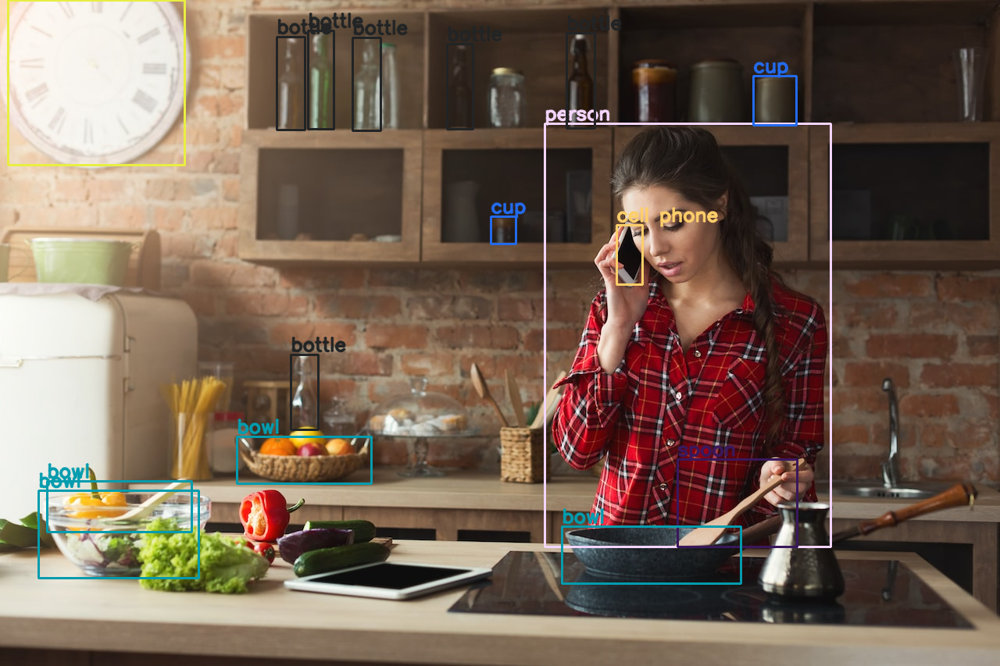

In [22]:
read_draw_img(model_fasterrcnn, "/content/inputs/cooking_img.jpg", "/content/outputs/cooking_img_det_fast.jpg", "fasterrcnn", visualize=True)

In [23]:
processVideo(model_fasterrcnn, "/content/inputs/cooking_gif.mp4", "/content/outputs/cooking_gif_det_fast.mp4", "fasterrcnn")

[INFO] Video is being processed...
[INFO] Video already processed
Average FPS: 2.562


In [24]:
# Visualization of a video
showVideo("/content/outputs/cooking_gif_det_fast.mp4")

## Tracking by Detection

Several models are currently used for Object Tracking. In this tutorial we will make use of [DeepSort](https://github.com/mikel-brostrom/Yolov5_DeepSort_Pytorch) method. We will make use of a special repository that was simplifies the commands for the tutorial. The original repository can only be used with simple modifications explained below.

#### Use existing code with Yolov5

In [25]:
!git clone --recurse-submodules https://github.com/mikel-brostrom/Yolov5_DeepSort_Pytorch.git
%cd Yolov5_DeepSort_Pytorch/

Cloning into 'Yolov5_DeepSort_Pytorch'...
remote: Enumerating objects: 904, done.
remote: Counting objects: 100% (898/898), done.
remote: Compressing objects: 100% (427/427), done.
remote: Total 904 (delta 414), reused 877 (delta 409), pack-reused 6
Receiving objects: 100% (904/904), 25.71 MiB | 28.83 MiB/s, done.
Resolving deltas: 100% (414/414), done.
Submodule 'yolov5' (https://github.com/ultralytics/yolov5.git) registered for path 'yolov5'
Cloning into '/content/Yolov5_DeepSort_Pytorch/yolov5'...
remote: Enumerating objects: 9803, done.        
remote: Counting objects: 100% (10/10), done.        
remote: Compressing objects: 100% (10/10), done.        
remote: Total 9803 (delta 2), reused 4 (delta 0), pack-reused 9793        
Receiving objects: 100% (9803/9803), 10.02 MiB | 23.42 MiB/s, done.
Resolving deltas: 100% (6820/6820), done.
Submodule path 'yolov5': checked out 'aa1859909c96d5e1fc839b2746b45038ee8465c9'
/content/Yolov5_DeepSort_Pytorch


In [26]:
! python3 track.py --source "/content/inputs/cooking_gif.mp4" --yolo_weights yolov5s.pt --output "/content/outputs/" --save-vid

100% 43.9M/43.9M [00:00<00:00, 116MB/s]

100% 14.0M/14.0M [00:00<00:00, 53.8MB/s]

video 1/1 (1/201) /content/inputs/cooking_gif.mp4: 384x640 2 persons, 2 bottles, 1 knife, 1 spoon, 2 bowls, 1 oven, Done. (0.029s)
video 1/1 (2/201) /content/inputs/cooking_gif.mp4: 384x640 2 persons, 2 bottles, 1 knife, 1 spoon, 2 bowls, 1 oven, Done. (0.030s)
video 1/1 (3/201) /content/inputs/cooking_gif.mp4: 384x640 2 persons, 3 bottles, 1 knife, 1 spoon, 2 bowls, 1 microwave, 1 oven, Done. (0.028s)
video 1/1 (4/201) /content/inputs/cooking_gif.mp4: 384x640 2 persons, 1 bottle, 1 knife, 1 spoon, 2 bowls, 1 microwave, 1 oven, Done. (0.028s)
video 1/1 (5/201) /content/inputs/cooking_gif.mp4: 384x640 2 persons, 1 bottle, 1 knife, 1 spoon, 2 bowls, 1 microwave, 1 oven, Done. (0.027s)
video 1/1 (6/201) /content/inputs/cooking_gif.mp4: 384x640 2 persons, 1 bottle, 1 knife, 1 spoon, 2 bowls, 1 microwave, 1 oven, Done. (0.026s)
video 1/1 (7/201) /content/inputs/cooking_gif.mp4: 384x640 2 persons, 2 bottles, 1

In [27]:
# Visualization of a video
showVideo("/content/outputs/cooking_gif.mp4")

#### Preparing environment

If we want to use the original deep sort, but some functionalities such as getting the class of the objects are not possible.
To use the original repository, please avoid the use of classes in tracker.update(...) function
```
%cd /content
! git clone https://github.com/ZQPei/deep_sort_pytorch.git
%cd deep_sort_pytorch/
! git checkout 000f52e658
! mv deep_sort /content/deep_sort
! mv /content/deep_sort_pytorch/configs/deep_sort.yaml  /content/deep_sort/configs.yaml
! mv /content/deep_sort_pytorch/utils/parser.py /content/deep_sort/parser.py
%cd ..
! rm -r Yolov5_DeepSort_Pytorch
```



In [28]:
%cd /content
! mv /content/Yolov5_DeepSort_Pytorch/deep_sort_pytorch /content/deepsort
! rm -r Yolov5_DeepSort_Pytorch

/content


In [29]:
! gdown https://drive.google.com/uc?id=1_qwTWdzT9dWNudpusgKavj_4elGgbkUN
! mv ckpt.t7 deepsort/ckpt.t7

Downloading...
From: https://drive.google.com/uc?id=1_qwTWdzT9dWNudpusgKavj_4elGgbkUN
To: /content/ckpt.t7
100% 46.0M/46.0M [00:00<00:00, 126MB/s] 


#### Function Definition

In [30]:
def draw_boxes(image, boxes, classes):
    # read the image with OpenCV
    #image = cv2.cvtColor(np.asarray(image), cv2.COLOR_BGR2RGB)
    for i, box in enumerate(boxes):
        color = COLORS[names.index(classes[i])]
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color, 2
        )
        cv2.putText(image, classes[i], (int(box[0]), int(box[1]-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2,
                    lineType=cv2.LINE_AA)
    return image

In [31]:
def processImage_track(model, image, network, device):
  if network == "yolov5":
    output  = model(image)
  elif network == 'fasterrcnn':
    frame = transform(image).to(device)
    frame = frame.unsqueeze(0) # add a batch dimension
    output = model(frame)
  boxes, classes, scores = getResults(output, network)
  return boxes, classes, scores

In [32]:
def prepareDeepSort():
  cfg = get_config()
  cfg.merge_from_file("/content/deepsort/configs/deep_sort.yaml")
  deepsort = DeepSort("/content/deepsort/ckpt.t7",
                            max_dist=cfg.DEEPSORT.MAX_DIST, min_confidence=cfg.DEEPSORT.MIN_CONFIDENCE,
                            max_iou_distance=cfg.DEEPSORT.MAX_IOU_DISTANCE,
                            max_age=cfg.DEEPSORT.MAX_AGE, n_init=cfg.DEEPSORT.N_INIT,
                            nn_budget=cfg.DEEPSORT.NN_BUDGET,
                            use_cuda=True)
  return deepsort

In [33]:
def bbox_rel(*xyxy):
    xyxy = xyxy[0]
    """" Calculates the relative bounding box from absolute pixel values. """
    bbox_left = min([xyxy[0].item(), xyxy[2].item()])
    bbox_top = min([xyxy[1].item(), xyxy[3].item()])
    bbox_w = abs(xyxy[0].item() - xyxy[2].item())
    bbox_h = abs(xyxy[1].item() - xyxy[3].item())
    x_c = (bbox_left + bbox_w / 2)
    y_c = (bbox_top + bbox_h / 2)
    return x_c, y_c, bbox_w, bbox_h

In [44]:
def drawTracker(outputs, frame):
  if len(outputs) > 0:
          bbox_xyxy = outputs[:, :4]
          identities = outputs[:, -2]
          clsss = outputs[:, -1]
          categories = [names[i] for i in clsss]
          frame = draw_boxes(frame, bbox_xyxy, categories)

  return frame

In [46]:
def runTracker(tracker, boxes, classes, scores, frame):
    if boxes is not None and len(boxes):
      bbox_xywh = []
      confs = scores

      # Adapt detections to deep sort input format
      for index, *xyxy in enumerate(boxes):
          x_c, y_c, bbox_w, bbox_h = bbox_rel(*xyxy)
          obj = [x_c, y_c, bbox_w, bbox_h]
          bbox_xywh.append(obj)

      xywhs = torch.Tensor(bbox_xywh)
      confss = torch.Tensor(confs)
      classs = torch.Tensor([names.index(cls) for cls in classes])
      # Pass detections to deepsort
      outputs = tracker.update(xywhs, confss, classs, frame)
    else:
      outputs = []
      tracker.increment_ages()
    return drawTracker(outputs, frame)
    

In [36]:
from deepsort.deep_sort import DeepSort
from deepsort.utils.parser import get_config

@torch.no_grad()
def processVideo_track(model, input_video_path, output_video_path, type_network, scale=1):
    
    cap, out, device, (fps, size, frame_length) = prepare_video(input_video_path, output_video_path,  scale=scale)
    frame_count = 0  # to count total frames
    total_fps = 0  # to get the final frames per second
    start_time_tot = time.time()
    model = model.to(device)
    deepsort = prepareDeepSort()

    # read until end of video
    print("[INFO] Video is being processed...")
    while (cap.isOpened()):
        # capture each frame of the video
        ret, frame = cap.read()
        if ret:
            frame = reformat_frame(frame, size)
            boxes, classes, scores = processImage_track(model, frame, type_network, device)
            frame  = runTracker(deepsort, boxes, classes, scores, frame)


            out.write(frame)

            frame_count += 1
            percentage = float(frame_count / frame_length) * 100
            if (percentage == 100):
                break
        else:
            break

    print("[INFO] Video already processed", flush=True)
    end_time = time.time()
    avg_fps = frame_length/(time.time()- start_time_tot)
    # release VideoCapture()
    cap.release()
    out.release()
    print(f"Average FPS: {avg_fps:.3f}", flush=True)

#### Inference with Yolov5

In [47]:
processVideo_track(yolov5_model, "/content/inputs/cooking_gif.mp4", "/content/outputs/cooking_gif_track_yolo.mp4", "yolov5")

Loading weights from /content/deepsort/ckpt.t7... Done!


[INFO] Video is being processed...
[INFO] Video already processed
Average FPS: 11.066


In [48]:
# Visualization of a video
showVideo("/content/outputs/cooking_gif_track_yolo.mp4")